# Изучение закономерностей, определяющих успешность игр

### Описание проекта

**Заказчик**: интернет-магазин «Стримчик». 

**Данные**: данные о продажах игр, оценках пользователей и экспертов, жанрах и платформах.  
**Особенность данных**: данные собраны из открытых источников.
**Период**: срез на декабрь 2016 г. (т.е. по 2016 году данные не полные)

**Описание данных**:  

    Name — название игры
    Platform — платформа
    Year_of_Release — год выпуска
    Genre — жанр игры
    NA_sales — продажи в Северной Америке (миллионы проданных копий)
    EU_sales — продажи в Европе (миллионы проданных копий)
    JP_sales — продажи в Японии (миллионы проданных копий)
    Other_sales — продажи в других странах (миллионы проданных копий)
    Critic_Score — оценка критиков (максимум 100)
    User_Score — оценка пользователей (максимум 10)
    Rating — рейтинг от организации ESRB (англ. Entertainment Software Rating Board)

**Бизнес-цель**: выявить потенциально популярный продукт для планирования рекламной кампании на 2017-й год.

**Задача**: выявить определяющие успешность игры закономерности.

### Анализ общей информации

Установим библиотеки, которые отсутствуют на сервере, но будут использоваться в проекте

In [ ]:
!pip install cufflinks -q
!pip install pingouin -q
!pip install tqdm -q
# Библиотека pandas-profiling не всегда устанавливается стабильно, поэтому принудительно зададим стабильные версии
!pip install pandas_profiling==1.4.1 -q
!pip install pandas==0.25.3 -q

Устанавливаемые библиотеки помогут в проведении более тщательного EDA анализа и визуализации результатов. Исследовательский анализ можно делать и с помощью ручного вызова функций дефолтных библиотек. Данные библиотеки выбраны для максимизации комфорта презентации результатов анализа бизнес-пользователям.

In [2]:
# Импортируем библиотеки, с помощью которых будем обрабатывать данные
import pandas_profiling # для анализа статистик и распределений данных
import pandas as pd # для работы с табличными данными
import numpy as np
from pingouin import ttest
from scipy.stats import norm
from sklearn.impute import MissingIndicator #для создания колонки с индикатором пропусков

# для визуализации данных
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly
import plotly.graph_objects as go
import plotly.express as px
import cufflinks as cf
%matplotlib inline
cf.go_offline()

from tqdm.notebook import tqdm

# Установка настроек для отображения всех колонок и строк при печати
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Настройки для печати нескольких выводов данных в одной ячейке
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Игнорирование предупреждения об ошибках
import warnings
warnings.filterwarnings('ignore')

Считываем данные

In [3]:
import pandas as pd # для работы с табличными данными

In [4]:
# Прочитаем данные и запишем в переменную df
name = 'games.csv'

try: 
    df = pd.read_csv('datasets\\{}'.format(name))
except:
    print(print('Файл {} не найден и будет скачиваться по сети.'.format(name)))
    df = pd.read_csv('https://code.s3.yandex.net/datasets/{}'.format(name))    

Файл games.csv не найден и будет скачиваться по сети.
None


In [5]:
df.loc[df.Name.str.contains("Uncharted 3: Drake's Deception")==True, :]

,Name,Platform,Year_of_Release,Genre,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score,User_Score,Rating
118,Uncharted 3: Drake's Deception,PS3,2011.0,Action,2.77,2.75,0.19,1.03,92.0,8.3,T


In [6]:
df.shape

(16715, 11)

In [7]:
# Запусим библиотеку pandas_profiling и посмотрим как выглядят статистики 
pandas_profiling.ProfileReport(df)

Number of variables,11
Number of observations,16715
Total Missing (%),12.1%
Total size in memory,1.4 MiB
Average record size in memory,88.0 B
Numeric,6
Categorical,5
Boolean,0
Date,0
Text (Unique),0
Rejected,0


Инструмент pandas_profiling позволяет изучить основную информацию о значениях и статистиках по признакам. Автоматический анализатор позволяет быстро получить информацию о типах данных, распределениях, наличиях пропусков и дублей в наборе данных. Так же можно увидеть информацию о корреляции между признаками или признаками и целевой переменной. Данный инструмент не позволяет ответить на все вопросы о наших данных, но помогает довольно быстро оценить основные проблемы, присутствующие в данных и определиться с инструментами для более детального анализа.

С помощью инструмента pandas_profiling удалось выявить следующие особенности:    
- `Year_of_Release` некорректный тип данных float64 => int, требуется преобразование типа, т.к. в признаке хранится дата  
- `Critic_Score` и `User_Score` имеют избыточную градацию оценок. Предлагается привести `Critic_Score` к шкале `User_Score`
- для упрощения даельнейшей работы в коде с наименованиями признаков, предлагается привести их к нижнему регистру

Сведем информацию о пропущенных значениях и их доле от общего количества значений в единую таблицу 

In [8]:
# Соберем таблицу пропущенных значений
def table_missing_data(df):
    missing_df = pd.DataFrame(data={'count': df.notnull().sum(),
                                    'missing': df.isnull().sum(),
                                    'missing_persent': df.isnull().sum()/df.shape[0]})

    (missing_df.query('missing!=0')
               .sort_values(by='missing_persent', ascending=False)
               .style.format({'missing_persent': "{:.2%}"}))
    
    return missing_df

In [9]:
table_missing_data(df)

,count,missing,missing_persent
Name,16713,2,0.000120
Platform,16715,0,0.000000
Year_of_Release,16446,269,0.016093
Genre,16713,2,0.000120
NA_sales,16715,0,0.000000
EU_sales,16715,0,0.000000
JP_sales,16715,0,0.000000
Other_sales,16715,0,0.000000
Critic_Score,8137,8578,0.513192
User_Score,10014,6701,0.400897


- На каждую колонку с пропусками добавить колонку "флаг" типа bool - есть/нет пропуск  
- Часть пропусков в переменной `Year_of_Release` заменить по алгоритму: по названию игры выявить год выпуска на других платформах, если в других строках год выпуска совпадает, то взять это значение для замены пропуска
- Оставшиеся строки с пропусками в переменной `Year_of_Release` - удалить, т.к. количествено их менее 2%, логически заполнить их невозможно или трудозатратно, а удаление не приведет к искажению данных.
- Пропуски в переменных `Critic_Score` и `User_Score` имеют достаточно большое количество пропусков, чтобы применять какие-либо стратегии заполнения - это может привести к искажению данных. Но для того чтобы в дальнейшем было удобно работать с этими признаками как с количественными, применим стратегию out_of_range: nan в `Critic_Score` заменим значением 110, nan в `User_Score` заменим значением 11.
- Применительно к переменной `Rating` предлагается следующий подход: 

Укрупнить категории до 4 групп:     
    - 'для детей' при значениях EC, K-A, E
    - 'для подростков ' при значении T, E10+
    - 'для взрослых' при значенииях M, AO
    - 'не указано' при значениии RP или пропуске   

Т.к. со значением рейтинга RP у нас только 3 объекта, предлагается пропуски также заменить на значение "не указано" и эти два типа данных обхъединятся. Если в последующем объектов с рейтингом RP станет существенно больше, то их следует относить к категории "нет рейтинга"

Наличие пропусков в данных, предположительно, обусловленно природой их сбора. 

Взглянем на строки с пропусками в колонках genre и name

In [10]:
df_NaN = df[(df['Genre'].isnull()) & (df['Name'].isnull())]
df_NaN.head()

,Name,Platform,Year_of_Release,Genre,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score,User_Score,Rating
659,NaN,GEN,1993.0,NaN,1.78,0.53,0.00,0.08,NaN,NaN,NaN
14244,NaN,GEN,1993.0,NaN,0.00,0.00,0.03,0.00,NaN,NaN,NaN


"Грязные" данные, появление которых может быть обусловлено способом их сбора, а правильность восстановить невозможно. Данные строки потребуется удалить из набора данных.

Посмотрим уникальные значения категориальных переменных чтобы проверить на наличие "мусорных" символов/значений

In [11]:
# Cоздадим список категориальных переменных
cat_columns = df.dtypes[df.dtypes == 'object'].index.tolist()

for i in tqdm(cat_columns):
    print(i, df[i].unique())

Name ['Wii Sports' 'Super Mario Bros.' 'Mario Kart Wii' ...
 'Woody Woodpecker in Crazy Castle 5' 'LMA Manager 2007'
 'Haitaka no Psychedelica']
Platform ['Wii' 'NES' 'GB' 'DS' 'X360' 'PS3' 'PS2' 'SNES' 'GBA' 'PS4' '3DS' 'N64'
 'PS' 'XB' 'PC' '2600' 'PSP' 'XOne' 'WiiU' 'GC' 'GEN' 'DC' 'PSV' 'SAT'
 'SCD' 'WS' 'NG' 'TG16' '3DO' 'GG' 'PCFX']
Genre ['Sports' 'Platform' 'Racing' 'Role-Playing' 'Puzzle' 'Misc' 'Shooter'
 'Simulation' 'Action' 'Fighting' 'Adventure' 'Strategy' nan]
User_Score ['8' nan '8.3' '8.5' '6.6' '8.4' '8.6' '7.7' '6.3' '7.4' '8.2' '9' '7.9'
 '8.1' '8.7' '7.1' '3.4' '5.3' '4.8' '3.2' '8.9' '6.4' '7.8' '7.5' '2.6'
 '7.2' '9.2' '7' '7.3' '4.3' '7.6' '5.7' '5' '9.1' '6.5' 'tbd' '8.8' '6.9'
 '9.4' '6.8' '6.1' '6.7' '5.4' '4' '4.9' '4.5' '9.3' '6.2' '4.2' '6' '3.7'
 '4.1' '5.8' '5.6' '5.5' '4.4' '4.6' '5.9' '3.9' '3.1' '2.9' '5.2' '3.3'
 '4.7' '5.1' '3.5' '2.5' '1.9' '3' '2.7' '2.2' '2' '9.5' '2.1' '3.6' '2.8'
 '1.8' '3.8' '0' '1.6' '9.6' '2.4' '1.7' '1.1' '0.3' '1.5' '0.7' 

В признаке `User_Score` имеются значения "tbd" - to be determined (рейтинг пока не определён). Их наличие автоматически преобразовывает признак в тип object, что неудобно для дальнейшего анализа показателя. В связи с этим предлагается заменить это значение по стратегии out_of_range на значение 12.

**Вывод**

- данные имеют достаточно большое количество пропусков в признаках `Critic_Score`, `Rating`, `User_Score`. Что может быть объяснено ручным способом сбора данных и качеством источников. Предлегаемая стратегия - заполнение пропусков значениями out-of-range, либо переименование в категорию 'не указано'. 
- категориальные данне имеют "сорные" ("tbd" в числовом признаке `User_Score`) или малочисленные значения (RP в признаке `Rating`) 
- потребуется преобразование типа данных для признака `Year_of_Release` 
- для признака `Rating`предлагается укрепнение категорий
- признаки `Critic_Score` и `User_Score` привести к единообразной шкале.

### Предобработка данных

Приведём названия колонок к нижнему регистру

In [12]:
df.columns = map(str.lower, df.columns)

Напишем функцию для создания индикатора пропусков для передаваемой переменной

In [13]:
def missing_flag(feature):
    """
    На вход принимает признак у которого есть пропуски, значение типа str
    Создает экземпляр класса MissingIndicator
    Обучает модель импутации
    Применяет обученную модель импутации к принятой переменной
    Результат сохраняет в новой колонке под названием имя_переменной+_flag
    """    
    miss_ind = MissingIndicator()
    miss_ind.fit(df[[feature]])
    df[feature + '_flag'] = miss_ind.transform(df[[feature]])

Осуществляем вызов функции missing_flag для признаков с пропусками 

In [14]:
for column_name in tqdm(['critic_score', 'rating', 'user_score', 
                    'year_of_release', 'genre', 'name']):
    missing_flag(column_name)

Обработаем пропуски в признаках year_of_release, name, genre

In [15]:
for column in ['year_of_release', 'name', 'genre']:
    print(f"Количество строк с пустыми значениями в признаке {column} до обработки: {df[column].isnull().sum()}.")

Количество строк с пустыми значениями в признаке year_of_release до обработки: 269.
Количество строк с пустыми значениями в признаке name до обработки: 2.
Количество строк с пустыми значениями в признаке genre до обработки: 2.


Заменим часть пропусков в колонке `year_of_release` по наличию этого значения по названию игры, если годы выпуска совпадали для всех платформ

In [16]:
# Отберем строки с пустыми значениями в отдельную таблицу
# Пройдем циклом по таблице 
# На каждой итерации отберем из первоначального набора данных годы выпуска по названию 
# Если годы выпуска одинаковые, то берем минимальное значение для заполнения пропуска

df_year_isnull = df.loc[df['year_of_release'].isnull()]

for index, row in tqdm(df_year_isnull.iterrows()):
    year_list = df.loc[(df['name']==row['name']) & (df['year_of_release'].notnull())]['year_of_release']
    if year_list.min() == year_list.max():
        df.loc[index,'year_of_release'] = year_list.min()

Удалим строки с пропусками в признаках `year_of_release`, `name`, `genre`

In [17]:
df.dropna(axis='index', how='any', subset=['year_of_release'], inplace=True)

In [18]:
for column in ['year_of_release', 'name', 'genre']:
    print(f"Количество строк с пустыми значениями в признаке {column} после обработки: {df[column].isnull().sum()}.")

Количество строк с пустыми значениями в признаке year_of_release после обработки: 0.
Количество строк с пустыми значениями в признаке name после обработки: 2.
Количество строк с пустыми значениями в признаке genre после обработки: 2.


Заменим на значение out_of_range:  
Nan в critic_score -> 110  
Nan в user_score -> 11  
'tbd' в user_score -> 12

In [19]:
df['critic_score'] = df['critic_score'].fillna(value=110)
df['user_score'] = df['user_score'].fillna(value=11)
df['user_score'] = df['user_score'].replace('tbd', 12)

Преобразуем типы данных:  
`year_of_release` => int  
`user_score` => float

In [20]:
df['year_of_release'] = df['year_of_release'].astype('int64')
df['user_score'] = df['user_score'].astype('float64')

Приведем значения оценок сritic_score к шкале user_score

In [21]:
df['critic_score'] = df['critic_score'] / 10

Напишем функцию для категоризации рейтинга возрастного ограничения игр по 4 группам и применим ее к признаку `rating`

In [22]:
def rating_group(rating):
        """
        На вход принимает рейтинг, значение типа str
        Возвращает принадлежность к одной из возрастных групп, используя правила:
        - 'для детей' при значениях EC, K-A, E
        - 'для подростков ' при значении T, E10+
        - 'для взрослых' при значенииях M, AO
        - 'не указано' при значениии RP или пропуске.
        """
        
        if rating == 'K-A' or rating == 'E' or rating == 'EC' :
                return 'для детей'
        if rating == 'T' or rating == 'E10+':
                return 'для подростков'
        if rating == 'M' or rating == 'AO':
                return 'для взрослых'
        return 'не указано'
    
df['rating'] = df['rating'].apply(rating_group)

Расчитаем Суммарные продажи на основе имеющихся данных

In [23]:
df['group_sales'] = df['na_sales'] + df['eu_sales'] + df['jp_sales'] + df['other_sales']

Убедимся в корректности преобразований данных

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16557 entries, 0 to 16714
Data columns (total 18 columns):
name                    16555 non-null object
platform                16557 non-null object
year_of_release         16557 non-null int64
genre                   16555 non-null object
na_sales                16557 non-null float64
eu_sales                16557 non-null float64
jp_sales                16557 non-null float64
other_sales             16557 non-null float64
critic_score            16557 non-null float64
user_score              16557 non-null float64
rating                  16557 non-null object
critic_score_flag       16557 non-null bool
rating_flag             16557 non-null bool
user_score_flag         16557 non-null bool
year_of_release_flag    16557 non-null bool
genre_flag              16557 non-null bool
name_flag               16557 non-null bool
group_sales             16557 non-null float64
dtypes: bool(6), float64(7), int64(1), object(4)
memory usage: 1.7+ M

**Вывод**

- Наименования колонок приведены к нижнему регистру
- Созданы новые колонки с флагами пропусков для признаков: `critic_score`, `rating`, `user_score`, `year_of_release`, `genre`, `name`
- Удалены некоторые строки со значениями Nan в переменных `genre`, `name`, `year_of_release`
- Произведена интеллектуальная замена пропусков для переменной `year_of_release`
- Произведена замена значений Nan в переменных `critic_score` и `user_score` на значения out_of_range
- Произведена категоризация значений переменной `rating`
- В переменной `user_score` значения "tbd" заменены на значение out_of_range 12
- Изменен тип данных для переменных `year_of_Release`, `critic_score` и `user_score`
- Создан новый признак: `group_sales`

### Исследовательский анализ данных

#### Анализ выпуска игр по годам

In [25]:
# Посмотрим, сколько игр выпускалось в разные годы
df_games_year = df.groupby('year_of_release')['name'].count().to_frame()
df_games_year.style.bar(color=['#5fba7d'])

,name
year_of_release,
1980,9
1981,46
1982,36
1983,17
1984,14
1985,14
1986,21
1987,16
1988,15


**Вывод**

Данные имеют распределение с тяжелым правым хвостом. Т.к. целью исследования является построение прогноза на 2017 год, то данные за период ранее 2000 года нам не пригодятся. Но, т.к. мы изучили не все особенности наших данных, то пока ограничивать период преждевременно.

#### Анализ продаж по платформам

Посмотрим, как менялись продажи по платформам. 
Выберем платформы с наибольшими суммарными продажами и построим распределение по годам.

In [26]:
# Сгруппируем и выберем платформы с наибольшими суммарными продажами
group_sales1 = (df.pivot_table(index='platform', 
                             values= 'group_sales', 
                             aggfunc='sum')
                             .reset_index()
                             .sort_values(by=('group_sales'), ascending=False))
               
group_sales1.style.bar('group_sales',color=['#c270a7'])

,platform,group_sales
16,PS2,1245.96
28,X360,966.61
17,PS3,934.71
26,Wii,903.31
4,DS,804.28
15,PS,727.58
18,PS4,314.14
6,GBA,313.73
19,PSP,292.77
13,PC,258.51


In [27]:
# Посмотрим объем продаж по годам
sales_year = df.groupby('year_of_release')['group_sales'].sum().to_frame()
sales_year.style.bar('group_sales',color=['#5fba7d'])

,group_sales
year_of_release,
1980,11.38
1981,35.68
1982,28.88
1983,16.8
1984,50.35
1985,53.95
1986,37.08
1987,21.7
1988,47.21


In [28]:
# Рассчитаем срок существования платформ
platform_life = (df.pivot_table(index='platform', 
                             values=['year_of_release'], 
                             aggfunc={'year_of_release':['min', 'max']})
                             .reset_index())
     
platform_life['platform_lifetime'] = platform_life['year_of_release']['max'] - platform_life['year_of_release']['min']
platform_life.sort_values(by=('platform_lifetime'), ascending=False)

platform year_of_release       platform_lifetime
                        max   min                  
13       PC            2016  1985                31
4        DS            2013  1985                28
5        GB            2001  1988                13
28     X360            2016  2005                11
19      PSP            2015  2004                11
17      PS3            2016  2005                11
16      PS2            2011  2000                11
11      NES            1994  1983                11
3        DC            2008  1998                10
26      Wii            2016  2006                10
0      2600            1989  1980                 9
23     SNES            1999  1990                 9
15       PS            2003  1994                 9
29       XB            2008  2000                 8
10      N64            2004  1996                 8
6       GBA            2007  2000                 7
7        GC            2007  2001                 6
2       3DS            2016  2010                 6
20      PSV            2016  2011                 5
21      SAT            1999  1994                 5
27     WiiU            2016  2012                 4
8       GEN            1994  1990                 4
12       NG            1996  1993                 3
30     XOne            2016  2013                 3
18      PS4            2016  2013                 3
25       WS            2001  1999                 2
1       3DO            1995  1994                 1
22      SCD            1994  1993                 1
24     TG16            1995  1995                 0
14     PCFX            1996  1996                 0
9        GG            1992  1992                 0

По информации из Wikipedia приставка DS была выпущена в 2004 году и перестала поддерживаться в 2013. 
Отфильтруем наши данные чтобы посмотреть почему в нашем слечае для платформы DS длительность жизни 28 лет

In [29]:
# Посмотрим на значения выходящие за этот диапазон 
df.query('platform == "DS" & year_of_release < 2004')

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,critic_score_flag,rating_flag,user_score_flag,year_of_release_flag,genre_flag,name_flag,group_sales
15957,Strongest Tokyo University Shogi DS,DS,1985,Action,0.0,0.0,0.02,0.0,11.0,11.0,не указано,True,True,True,False,False,False,0.02


In [30]:
# Удалим строку с выявленным ошибочным значением
df = df.drop(15957)

In [31]:
# Обновим данные сводной таблицы после корректировки набора данных
platform_life = (df.pivot_table(index='platform', 
                             values=['year_of_release'], 
                             aggfunc={'year_of_release':['min', 'max']})
                             .reset_index())

  
platform_life['platform_lifetime'] = platform_life['year_of_release']['max'] - platform_life['year_of_release']['min']

# Построим гисторгамму по сроку существования платформ 
platform_life['platform_lifetime'].iplot(kind='histogram', 
                                         bins=30,
                                         title='Гисторгамма по сроку существования платформ',
                                         xTitle='Срок существования платформы',
                                         yTitle='Количество платформ')

# Выведем описательные статистики
platform_life['platform_lifetime'].describe()

count    31.000000
mean      7.129032
std       5.908987
min       0.000000
25%       3.000000
50%       7.000000
75%      10.000000
max      31.000000
Name: platform_lifetime, dtype: float64

In [32]:
# Посмотрим распределение объемов продаж по годам в разрезе платформ, 
# Для TOP-6 платформ по объему продаж
top6 = ['PS2', 'X360', 'PS3', 'Wii', 'DS', 'PS']
df_for_analys = df.query('platform == @top6')
group_sales2 = df_for_analys.pivot_table(index=['year_of_release', 'platform'], 
                             values= 'group_sales', 
                             aggfunc='sum').rename(columns={'group_sales':'s'})
                            
                           
group_sales2.unstack().iplot(
    kind='bar',
    barmode='stack',
    title='Диаграмма распределение объемов продаж по годам в разрезе платформ. Для TOP-6 платформ',
    xTitle='Год выпуска',
    yTitle='Общие продажи',
    hoverinfo = 'y + name')

In [33]:
# Посмотрим общую картину срока существования платформ с помощью диаграмм boxplot
df.pivot(columns='platform', values='year_of_release').iplot(
                                                        kind='box',
                                                        title='Диаграмма срока существования платформ',
                                                        xTitle='Платформа',
                                                        yTitle='Год')

**Вывод**

- Платформы с наибольшими суммарными продажами: PS2, X360, PS3, Wii, DS, PS
- Максимальный объем продаж по всем платформам наблюдался в 2008 году - 680.44 млн. Что коррелирует с максимальным количеством выпущенных игр - 1440
- По статистическим данным средний срок существования игровой платформы семь лет
- На момент конца 2016 года появились две потенциально прибыльные платформы, которые не дошли до среднестатистической середины срока жизни: PS4 и XOne - они находятся на пике популярности
- Среди представленных платформ имеется значение критично отличающееся от других - PC платформа с максимальным сроком существования 31 год.

В ходе анализа была выявлена ошибка - некорректная информация по платформе игры Strongest Tokyo University Shogi DS, т.к. платформы DS в 1985 году еще не существовало. Предположительная причина ошибочных данных - непроверенные источники данных. 

#### Выбор актуального периода

Отберем платформы по которым на конец 2016 года продолжается выпуск игр

In [34]:
df.query('year_of_release == 2016')['platform'].unique()

array(['PS4', '3DS', 'XOne', 'WiiU', 'PS3', 'PC', 'X360', 'PSV', 'Wii'],
      dtype=object)

Посмотрим распределение объемов продаж по годам в разрезе платформ, для актуальных платформ по выпуску

In [35]:
actual_platform = ['PS4', '3DS', 'XOne', 'WiiU', 'PS3', 'PC', 'X360', 'PSV', 'Wii']
group_sales3 = (df.query('platform == @actual_platform').pivot_table(index=['year_of_release', 'platform'], 
                             values= 'group_sales', 
                             aggfunc='sum')
                            .rename(columns={'group_sales':'s'}))
                           
group_sales3.unstack().iplot(
    kind='bar',
    barmode='stack',
    title='Диаграмма распределение объемов продаж по годам в разрезе платформ. Для актуальных платформ по выпуску',
    xTitle='Год выпуска',
    yTitle='Общие продажи',
    hoverinfo = 'y + name')

Для прогноза на 2017 год разумным является анализировать данные по актуальным платформам - для которых продолжается выпуск игр на конец 2016 года. В связи с этим, актуальным будем считать период 2012-2016гг.

In [36]:
# Создадим новый набор данных по актуальному периоду
df_actual = df.query('year_of_release >= 2012 & year_of_release < 2016')

In [37]:
# Определим какие платформы лидируют по продажам
platform_lead = df_actual.query('platform == @actual_platform').pivot_table(index=['platform'], 
                             values= 'group_sales', 
                             aggfunc='sum').reset_index()
platform_lead.sort_values(by='group_sales', ascending=False)

,platform,group_sales
2,PS3,286.11
3,PS4,244.89
7,X360,236.00
0,3DS,179.87
8,XOne,133.17
6,WiiU,77.59
1,PC,57.91
4,PSV,44.93
5,Wii,36.42


**Вывод**

Для прогноза на 2017 год разумным является анализировать данные по актуальным платформам - для которых продолжается выпуск игр на конец 2016 года.

Анализ продаж по платформам в актуальном периоде показал:

- максимальный объём продаж  
PS3	    286.11 млн  
PS4	    244.89 млн  
X360	236.00 млн

- растут по продажам  
XOne, PS4

- падают по продажам  
X360, Wii, PS3, 3DS

Потенциально прибыльными платформами являются PS4 и XOne т.к. продажи по ним начинают активно расти

#### Анализ глобальных продаж игр в разбивке по платформам

Проанализируем объем продаж по актуальным платформам за актуальный период

In [38]:
volume_sales = (df_actual.pivot_table(index=['platform','year_of_release'], 
                                     values= ['name', 'group_sales'], 
                                     aggfunc={'group_sales': 'sum', 'name': 'count'})
                        .reset_index())
volume_sales.style.bar(['group_sales','name'],color=['#5fba7d'])

,platform,year_of_release,group_sales,name
0,3DS,2012,51.76,94
1,3DS,2013,56.57,91
2,3DS,2014,43.76,80
3,3DS,2015,27.78,86
4,DS,2012,11.67,24
5,DS,2013,1.54,8
6,PC,2012,23.45,63
7,PC,2013,12.66,40
8,PC,2014,13.28,47
9,PC,2015,8.52,50


Посмотрим распределение объемов продаж по годам в разрезе платформ, для актуальных платформ по выпуску

In [39]:
group_sales4 = (df_actual.pivot_table(index=['year_of_release', 'platform'], 
                             values= ['group_sales'], 
                             aggfunc={'group_sales': 'sum'})
                        .rename(columns={'group_sales': 's'}))
                

layout = {'hovermode':"x",
         'title':'Диаграмма распределение объемов продаж по годам в разрезе платформ',
          'yaxis': {'title': 'Общие продажи'},
          'xaxis': {'title': 'Год выпуска'}}   


group_sales4.unstack().iplot(
    kind='bar',
    layout = layout)

Построим график boxplot по продажам за актуальный период в разрезе платформ.

In [40]:
layout = {'title':'Диаграмма по продажам за актуальный период в разрезе платформ',
           'yaxis': {'title': 'Продажи игр',
                    'range':[0, 1.2]},
          'xaxis': {'title': 'Платформа'}}

df_actual.pivot(columns='platform', values='group_sales').iplot(
                                                        kind='box',
                                                        layout = layout)

**Вывод**

1. Платформа DS:
    - появилась в 2004 году, максимальный объем продаж в 2007 году, на следующий год при увеличенном объеме выщенных игр объемы остались на уровне 2007 года и после этого пошел спад по выпуску и объемам продаж. На смену, в 2010 году, пришла платформа 3DS, которая не отличалась высокими показателями и продержалась ровно вплоть до 2015 года, когда при том же выпуске продажи сократились почти вдвое. 
    
    
2. Платформа Wii:  
    - появилясь в 2006 году. Для этой платформы выпускались уникальные игры, которые выпускались только для нее и принели большую выручку. Пик по количеству игр и объемам продаж пришелся на 2008-2009 годы, после чего заметен постепенный спад продолжавшийся до 2016 года. На смену пришла платформа WiiU которая не смогла повторить популярность предыдущей платформы. Примерно в это же время на рынке появились PS4 и XOne, которые завоевали бОльшую популярность и продолжают активный рост по состоянию на 2016 год.  
    
    
3. Платформа X360:
    - появилась в 2005 году, максимальный объем продаж в 2010 году, в 2011 несмотря на увеличение выпуска, объем снизился и продолжает падать. На смену пришла успешная XOne, которая активно набирает популярность, что отражается на объеме продаж и выпуска.
    
    
4. Платформа PS:
    - за анализируемый период мы видим как с рынка постепенно ушла платформа PS2. На смену ей пришла PS3, которая достигла своего пика в 2011 году и постепенно пошла на спад. На смену PS3 пришла платформа PS4, которая набирает популярность, что отражается на объеме продаж и выпуска.  


5. Платформа PC:
    - стабильная платформа с самым длительным периодом существования без явных всплесков по выпуску и продажам.
    
Выявлено характерное поведение по смене платформ: на второй год существования новой платформы, которая пришла на смену предыдущей, характерно выравнивание показателей по объему продаж. 

#### Анализ влияния отзывов пользователей и критиков на продажи на примере платформы PS4

Построим график типа scatterplot для признаков user_score, critic_score, group_sales на примере платформы PS4

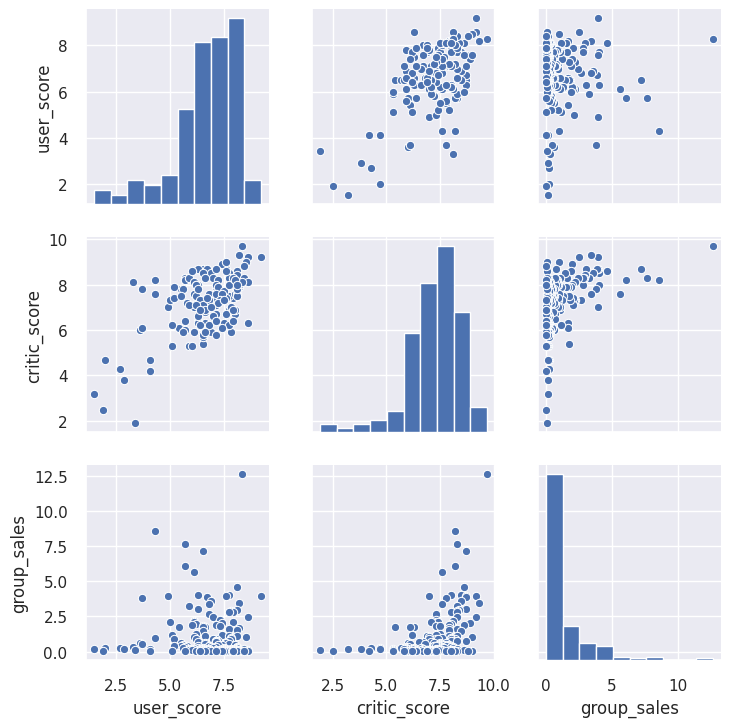

In [41]:
sns.set() 
sns.pairplot(df_actual.query('platform == "PS4" & user_score < 11 & critic_score < 11')[['user_score', 'critic_score', 'group_sales']], size = 2.5)
plt.show();

Посчитаем корреляцию для user_score, critic_score и group_sales

In [42]:
df_actual.query('platform == "PS4" & user_score < 11 & critic_score < 11')[['user_score', 'critic_score', 'group_sales']].corr()

,user_score,critic_score,group_sales
user_score,1.000000,0.612451,0.018139
critic_score,0.612451,1.000000,0.430777
group_sales,0.018139,0.430777,1.000000


**Вывод**

- в наличии слабая корреляция между общими продажами и оценкой критиков - чем выше оценки критиков, тем больше продажи
- отсутствие корреляции между общими продажами и оценкой пользователей
- корреляция средней силы между оценкой критиков и пользователей

#### Анализ влияния отзывов пользователей и критиков на продажи на примере других платформ

Построим график типа scatterplot для признаков user_score, critic_score, group_sales
для платформ Wii, PS3, PC, XOne

Text(0.5, 1.08, 'Wii')

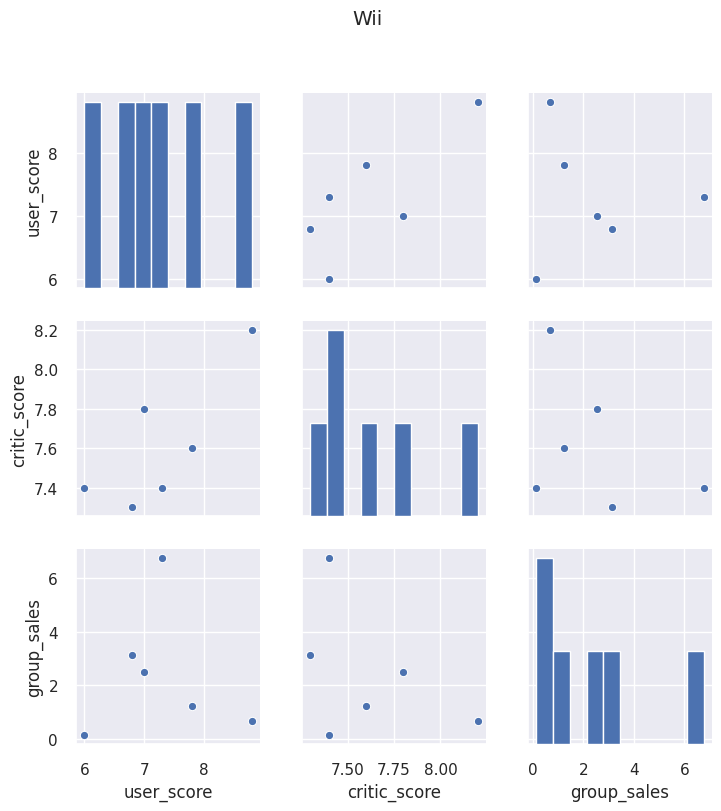

Корреляционная матрица


,user_score,critic_score,group_sales
user_score,1.000000,0.780222,-0.054722
critic_score,0.780222,1.000000,-0.405997
group_sales,-0.054722,-0.405997,1.000000


Text(0.5, 1.08, 'PS3')

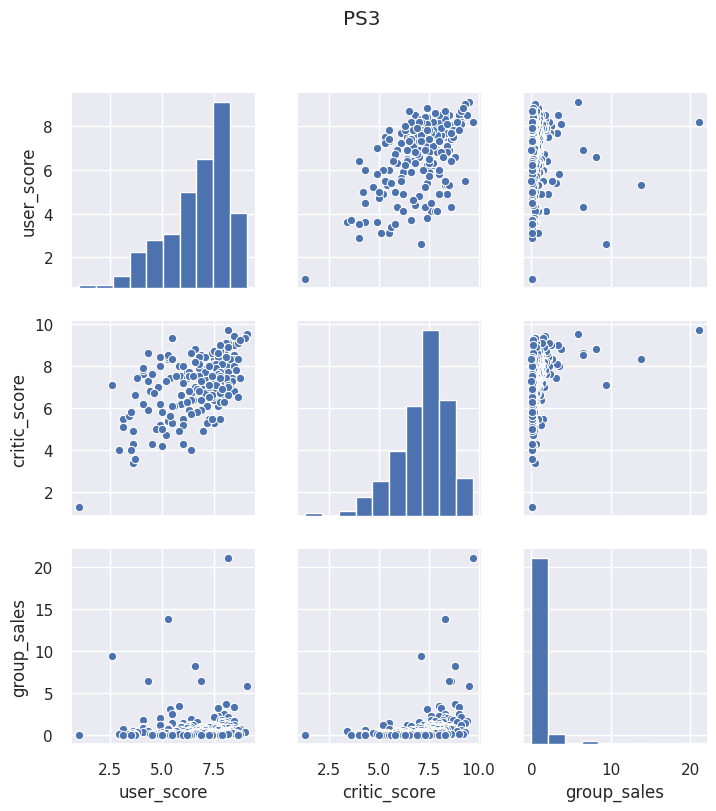

Корреляционная матрица


,user_score,critic_score,group_sales
user_score,1.000000,0.539525,0.003079
critic_score,0.539525,1.000000,0.330931
group_sales,0.003079,0.330931,1.000000


Text(0.5, 1.08, 'PC')

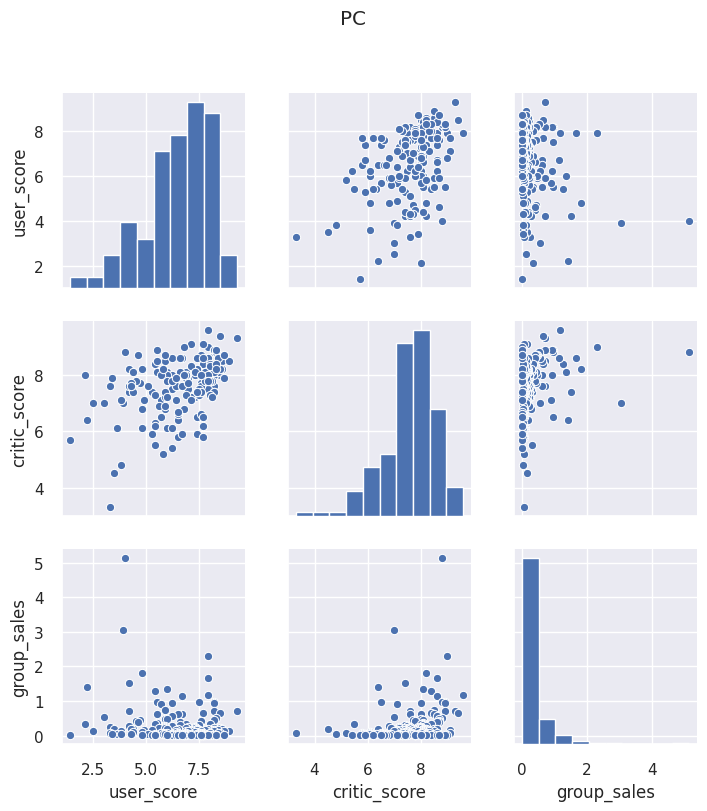

Корреляционная матрица


,user_score,critic_score,group_sales
user_score,1.000000,0.415737,-0.182020
critic_score,0.415737,1.000000,0.265762
group_sales,-0.182020,0.265762,1.000000


Text(0.5, 1.08, 'XOne')

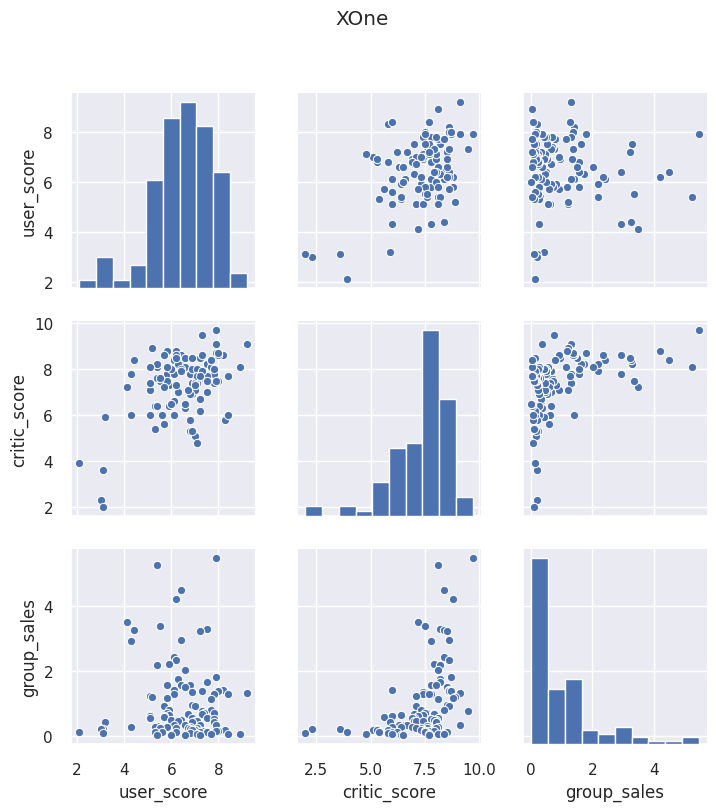

Корреляционная матрица


,user_score,critic_score,group_sales
user_score,1.000000,0.499502,-0.051243
critic_score,0.499502,1.000000,0.451360
group_sales,-0.051243,0.451360,1.000000


In [43]:
for platform in tqdm(['Wii', 'PS3', 'PC', 'XOne']):
    sns.set()
    g = sns.pairplot(df_actual.query('platform == @platform & user_score < 11 & critic_score < 11')[['user_score', 'critic_score', 'group_sales']], size = 2.5);
    g.fig.suptitle(platform, y=1.08);
    plt.show();
    # Посчитаем корреляцию для user_score, critic_score и group_sales
    print("Корреляционная матрица")
    df_actual.query('platform == @platform & user_score < 11 & critic_score < 11')[['user_score', 'critic_score', 'group_sales']].corr()

Среди проанализированных платформ корреляция средней силы между оценкой критиков и пользователей наблюдается по платформам Wii И PS3. По остальным показателям значимой корреляции не выявлено.

Проанализируем количество пропущенных оценок критиков и пользовательских оценок tbd

In [44]:
(df_actual.query('critic_score > 10 & user_score > 10')
          .groupby('platform')
          .agg({'user_score': 'count', 
                'critic_score': 'count'})
          .sort_values(by='critic_score', 
                      ascending=False))

,user_score,critic_score
platform,,
3DS,244,244
PSV,208,208
PS3,180,180
PSP,171,171
PS4,71,71
X360,52,52
WiiU,42,42
XOne,42,42
Wii,36,36


**Вывод**

Анализ влияния отзывов пользователей и критиков на продажи по другим платформам показал, что для некоторых платформ (таких как PS3, XOne) ситуация аналогична платформе PS4, но для некоторых платформ, таких как DS, PSP, Wii, отличаются. Видно, что по этим платформам большое количество пропущенных значений оценок (напомним, что ранее пропуски заменялись по стратегии out-of-range на значение 11). В связи с этим сложно делать выводы о взаимосвязи оценок и продаж. Но следует учитывать, что используемый в анализе коэфффициент корреляции Пирсона показывает только линейную связь между переменными.

#### Анализ распределения игр по жанрам

Посмотрим на распределение продаж и количества игр по жантрам

In [45]:
genres = (df_actual.groupby('genre')
                   .aggregate({'name': 'count', 
                               'group_sales': 'sum'})
                   .rename(columns = {'name':'count', 
                                      'group_sales': 'group_sales'}))

# Добавим колонку с расчетным признаком отражающим прибыль одной игры
genres['index'] = genres['group_sales'] / genres['count']   
(genres.sort_values(by='group_sales', ascending=False)
      .style.bar('index',color=['#5fba7d'])) 

,count,group_sales,index
genre,,,
Action,862,415.95,0.482541
Shooter,190,266.53,1.40279
Role-Playing,316,174.62,0.552595
Sports,220,157.58,0.716273
Misc,161,82.68,0.51354
Platform,70,57.77,0.825286
Racing,91,50.71,0.557253
Fighting,93,40.02,0.430323
Simulation,62,33.23,0.535968


Построим диаграмму распределения продаж и количества игр по жанрам

In [46]:
fig = genres[['group_sales','count']].iplot(
    kind='bar', 
    bins=30, 
    title='Диаграмма распределения продаж и количества игр по жанрам', 
    xTitle='Жанры',
    yTitle='Общие продажи', 
    secondary_y='count', 
    secondary_y_title='Количество выпущенных игр')

**Вывод** 

Максимальное количество игр было выпущено в жанрах: Action, Sports, Misc  
Жанры с самыми большими продажами: Action, Sports, Shooter  
Жанры с самыми низкими продажами: Puzzle, Strategy   
Самые прибыльные жанры: Shooter, Platform  

В данных результатах прослеживается адекватная логика - нет смысла выпускать игры в жанрах, по которым наблюдаются низкие продажи на рынке или в жанрах, которые не являются максимально прибыльными в сравнении с другими. Низкие продажи игр определенных жанров, например Puzzle могут быть обусловлены сменой вкусов пользователей, отсутствием разделения на поджанры, плохой сюжетной проработкой. Для выявления причин низких продаж требуется собрать дополнительную информацию.

**Вывод по разделу "Исследовательский анализ данных"**

Данные имеют распределение с тяжелым правым хвостом.

Платформы с наибольшими суммарными продажами: PS2, X360, PS3, Wii, DS, PS

По статистическим данным средний срок существования игровой платформы семь лет

Для прогноза на 2017 год разумным является анализировать данные по актуальным платформам - для которых продолжается выпуск игр на конец 2016 года.

Максимальный объём продаж у X360, PS3, Wii	    

Потенциально прибыльными платформами являются PS4 и XOne

Выявлено характерное поведение по смене платформ: на второй год существования новой платформы, которая пришла на смену предыдущей, характерно выравнивание показателей по объему продаж. 

Имеется зависимость между общими продажами и оценкой критиков - чем выше оценки критиков, тем больше продажи

Максимальное количество игр было выпущено в жанрах: Action, Sports, Misc  
Жанры с самыми большими продажами: Action, Sports, Shooter  
Жанры с самыми низкими продажами: Puzzle, Strategy   
Самые прибыльные жанры: Shooter, Platform  

### Портрет пользователя по регионам

#### Топ-5 популярных платформ по регионам (NA, EU, JP)

Посмотрим на группировку продаж по платформам в разрезе стран 

In [47]:
for column in ['na_sales','eu_sales', 'jp_sales']:
    print('Топ-5 популярных платформ в', column[0:2].upper())
    top5_platform = df_actual.groupby('platform').agg('sum').reset_index()
    top5_platform['volume_sales'] = top5_platform[column] / top5_platform['group_sales']
    (top5_platform[['platform', column, 'volume_sales']].sort_values(by=column, ascending=False).
    head(5).style.format({'volume_sales':"{:.2%}"}))

Топ-5 популярных платформ в NA


,platform,na_sales,volume_sales
9,X360,139.88,59.27%
3,PS3,103.07,36.02%
4,PS4,87.25,35.63%
10,XOne,78.85,59.21%
0,3DS,51.35,28.55%


Топ-5 популярных платформ в EU


,platform,eu_sales,volume_sales
4,PS4,109.31,44.64%
3,PS3,106.01,37.05%
9,X360,74.18,31.43%
10,XOne,41.96,31.51%
0,3DS,40.5,22.52%


Топ-5 популярных платформ в JP


,platform,jp_sales,volume_sales
0,3DS,79.76,44.34%
3,PS3,33.99,11.88%
6,PSV,17.48,38.90%
8,WiiU,12.34,15.90%
5,PSP,10.71,91.62%


**Вывод**

Анализ продаж по платформам показал различие рынков: 

Платформы находящиеся на первых позициях по продажам на Американском и Европейском рынках, не входят в TOP-5 на Японском и наоборот. 

Например: 
1. X360:
    - занимает первое место в Америке (59.27% продаж игр для данной платформы) 
    - третье в Европе (31.43% продаж игр для данной платформы) 
    - не входит в TOP-5 в Японии
2. PS3:
    - занимает второе место по продажам в Америке, Европе и Японии
3. PSP:
    - занимает пятое место по продажам в Японии 
    - в Америке и Европе не входит в TOP-5 по продажам


#### Top-5 популярных жанров

Посмотрим на группировку продаж по жанрам в разрезе стран 

In [48]:
for column in ['na_sales','eu_sales', 'jp_sales']:
    print('Топ-5 популярных жанров в', column[0:2].upper())
    top5_platform = df_actual.groupby('genre').agg('sum').reset_index()
    top5_platform['volume_sales'] = top5_platform[column] / top5_platform['group_sales']
    (top5_platform[['genre', column, 'volume_sales']]
    .sort_values(by=column, ascending=False).head(5)
    .style.format({'volume_sales':"{:.2%}"})
    .bar(column,color=['#5fba7d']))

Топ-5 популярных жанров в NA


,genre,na_sales,volume_sales
0,Action,170.8,41.06%
8,Shooter,128.55,48.23%
10,Sports,73.99,46.95%
7,Role-Playing,58.11,33.28%
3,Misc,37.43,45.27%


Топ-5 популярных жанров в EU


,genre,eu_sales,volume_sales
0,Action,150.77,36.25%
8,Shooter,97.57,36.61%
10,Sports,57.08,36.22%
7,Role-Playing,44.25,25.34%
3,Misc,25.66,31.04%


Топ-5 популярных жанров в JP


,genre,jp_sales,volume_sales
7,Role-Playing,58.83,33.69%
0,Action,45.73,10.99%
3,Misc,12.06,14.59%
9,Simulation,10.08,30.33%
2,Fighting,8.69,21.71%


**Вывод**

Анализ жанров показал, что в Европе и Северной Америке лидурет жанр Action, в то время как в Японии лидирует Role-Playing т.к. там самые популярные серии игр Pokemon и Final Fantasy относятся к жанру Role-Playing.

#### Влияние ли рейтинга ESRB на продажи в отдельном регионе

Посмотрим на группировку продаж по рейтингу в разрезе стран 

In [49]:
for column in ['na_sales','eu_sales', 'jp_sales']:
    print('Влияние рейтинга ESRB на продажи в', column[0:2].upper())
    top5_platform = df_actual.groupby('rating').agg('sum').reset_index()
    top5_platform[['rating', column]].sort_values(by=column, ascending=False).head(5).style.bar(column,color=['#5fba7d'])

Влияние рейтинга ESRB на продажи в NA


,rating,na_sales
0,для взрослых,215.94
2,для подростков,131.19
1,для детей,106.4
3,не указано,94.78


Влияние рейтинга ESRB на продажи в EU


,rating,eu_sales
0,для взрослых,177.65
1,для детей,99.42
2,для подростков,96.61
3,не указано,84.03


Влияние рейтинга ESRB на продажи в JP


,rating,jp_sales
3,не указано,94.76
2,для подростков,31.49
1,для детей,27.26
0,для взрослых,20


**Вывод**

В Европе и Америке первые две позиции не критично отличаются по продажам. В Японии на первом месте без рейтинга или те, где рейтинг был не указан. Как результат, рейтинг не оказывает влияние на продажи. 

**Вывод по разделу "Портрет пользователя по регионам"** 

Профиль пользователя Америки: взрослый/подросток, играющий в игры жанра Action/Sport на платформах X360/PS3/PS4  
Профиль пользователя Европы: взрослый/ребенок, играющий в игры жанра Action/Sport на платформах PS4/PS3  
Профиль пользователя Японии: подросток, играющий в игры жанра Role-Playing/Action на платформах 3DS/PS3  

Схожеть предпочтений между пользователями Америки и Европы может быть объяснимо схожими культурными традициями. Тем же объясняется и отличие от них пользовательских предпочтений по жанрам для жителей Японии. Так же анализ подтвердил известную особенность zпонского рынка, заключающуюся в том, что там наиболее популярны консоли, в особенности Nintendo.

### Исследование статистических показателей

In [50]:
res_critic = df_actual.pivot_table(index=['year_of_release', 'genre'], values='critic_score', aggfunc='sum').reset_index()

Построим график распредений по жанрам для оценок критиков

In [51]:
px.histogram(res_critic, y="critic_score", x='genre',
       animation_frame="year_of_release", color='genre', range_y=[0, 2500])

In [52]:
res_user = df_actual.pivot_table(index=['year_of_release', 'genre'], values='user_score', aggfunc='sum').reset_index()

Построим график распредений  по жанрам для оценок пользователей

In [53]:
px.histogram(res_user, y="user_score", x='genre',
       animation_frame="year_of_release", color='genre',
       range_y=[0, 2500])

В большинстве жанров, оценки критиков и пользователей после 2011 года уменьшились. 
Т.к. визуально распределения оценок пользователей и критиком очень похожи, лучше оценивать по статистикам.

Выведем таблицу статистических показателей для оценок пользователей и критиков по жанрам

In [54]:
df_actual.pivot_table(index = 'genre', values = ['critic_score', 'user_score'], aggfunc = ['var', 'std', 'mean'])

var                     std                    mean  \
             critic_score user_score critic_score user_score critic_score   
genre                                                                       
Action           4.256499   5.474988     2.063128   2.339869     9.331671   
Adventure        2.228381   2.664021     1.492776   1.632183    10.370325   
Fighting         5.131910   5.125086     2.265372   2.263865     8.663441   
Misc             3.341872   4.875543     1.828079   2.208063     9.822360   
Platform         3.862948   4.755282     1.965438   2.180661     8.662857   
Puzzle           2.904131   3.556154     1.704151   1.885777     9.848148   
Racing           4.292269   6.889827     2.071779   2.624848     8.186813   
Role-Playing     4.147959   4.449110     2.036654   2.109291     9.341456   
Shooter          3.980759   4.714576     1.995184   2.171307     8.323684   
Simulation       5.455568   6.931457     2.335716   2.632766     9.012903   
Sports           4.826256   8.879290     2.196874   2.979814     8.999545   
Strategy         3.966295   8.289840     1.991556   2.879208     9.539655   

                         
             user_score  
genre                    
Action         8.917865  
Adventure     10.269106  
Fighting       8.376344  
Misc           9.495652  
Platform       7.952857  
Puzzle        10.100000  
Racing         7.180220  
Role-Playing   9.205696  
Shooter        7.191053  
Simulation     8.766129  
Sports         7.095000  
Strategy       8.722414

**Вывод**

Пользовательские оценки и оценки критиков разбросаны равномерно для большинства жанров. Критики чаще ставят низкие оценки и оценивают жанры, которые пользователи считают непопулярными. Пользователи оценивают жанры Strategy, Sports и Simulation	выше критиков, а критики ценят Puzzle больше пользователей.

### Проверка гипотез

#### Гипотеза 1: Средние пользовательские рейтинги платформ Xbox One и PC одинаковые

Сформулируем гипотезы для проверки:   
    - нулевая гипотеза H₀: средние пользовательские оценки платформ Xbox One и PC не различаются
    - альтернативная гипотеза H₁: средние пользовательские оценки платформ Xbox One и PC различаются

In [55]:
# Сформируем подвыборки
subdf_1 = df_actual.query('platform == "XOne" & user_score <= 10')['user_score']
subdf_2 = df_actual.query('platform == "PC" & user_score <= 10')['user_score']

In [56]:
# Посчитаем среднее и дисперсию в разрезе платформ
(df_actual.query('platform == "XOne" | platform == "PC" & user_score <= 10')
         .groupby('platform', as_index=False)
         .aggregate({'user_score': ('mean', 'var')}))

platform user_score          
                 mean       var
0       PC   6.473333  2.672943
1     XOne   7.740000  5.445811

Построим гистрограммы распределений по платформам XOne и PC в разрезе пользовательских оценок, с наложением фактического распределения и нормального 

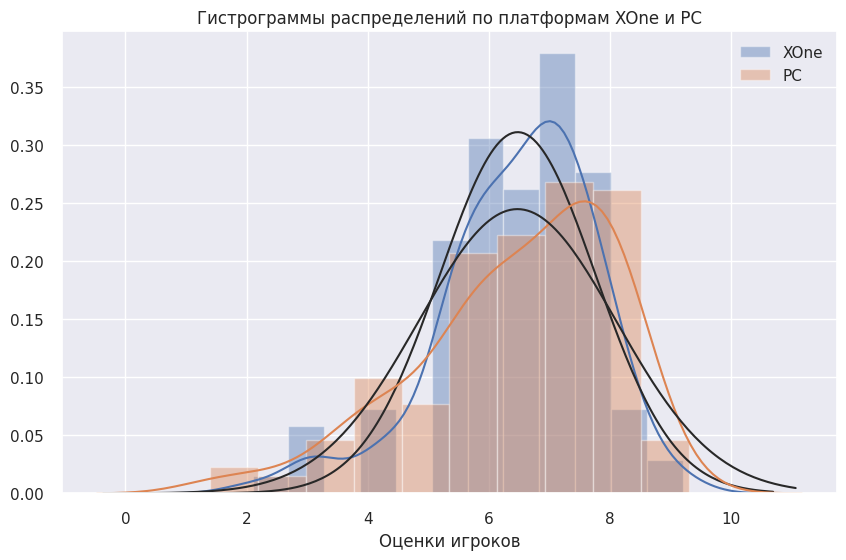

In [57]:
for column in ['user_score']: 
    fig = plt.figure(figsize=(10,6)) 
    ax1 = sns.distplot(subdf_1, label='XOne', fit=norm) 
    ax2 = sns.distplot(subdf_2, label='PC', fit=norm) 
    ax3 = plt.legend() 
    ax4 = plt.title('Гистрограммы распределений по платформам XOne и PC')
    ax5 = plt.xlabel('Оценки игроков')
    plt.show(); 

Чтобы проверить гипотезу о равенстве среднего двух выборок, применим двухсторонний тест, поскольку нам не требуется сравнивать динамику среднего значения.

Уровень статистической значимости установим в значении 0.05 (порог 5% считается общепринятиым).  
Если p-value окажется меньше него - отвергнем нулевую гипотезу.

In [58]:
results = ttest(subdf_1, subdf_2, paired=False, tail='two-sided')

alpha = .05 

print('p-значение:', results['p-val'][0])

if results['p-val'][0] < alpha:
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу") 

p-значение: 0.9805913591149551
Не получилось отвергнуть нулевую гипотезу


#### Гипотеза 2: Средние пользовательские рейтинги жанров Action и Sports разные

Сформулируем гипотезы для проверки:   
    - нулевая гипотеза H₀: cредние пользовательские оценки жанров Action и Sports не различаются
    - альтернативная гипотеза H₁: cредние пользовательские оценки жанров Action и Sports различаются

Сформируем подвыборки

In [59]:
subdf_3 = df_actual.query('genre == "Action" & user_score <= 10')['user_score']
subdf_4 = df_actual.query('genre == "Sports" & user_score <= 10')['user_score']

Посчитаем среднее и дисперсию в разрезе жанров

In [60]:
(df_actual.query('genre == "Action" | genre == "Sports" & user_score <= 10')
          .groupby('genre', as_index=False)
          .aggregate({'user_score': ('mean', 'var')}))

genre user_score          
                mean       var
0  Action   8.917865  5.474988
1  Sports   5.461392  2.780347

Построим гистрограммы распределений по жанрам Action и Sports в разрезе пользовательских оценок, с наложением фактического распределения и нормального 

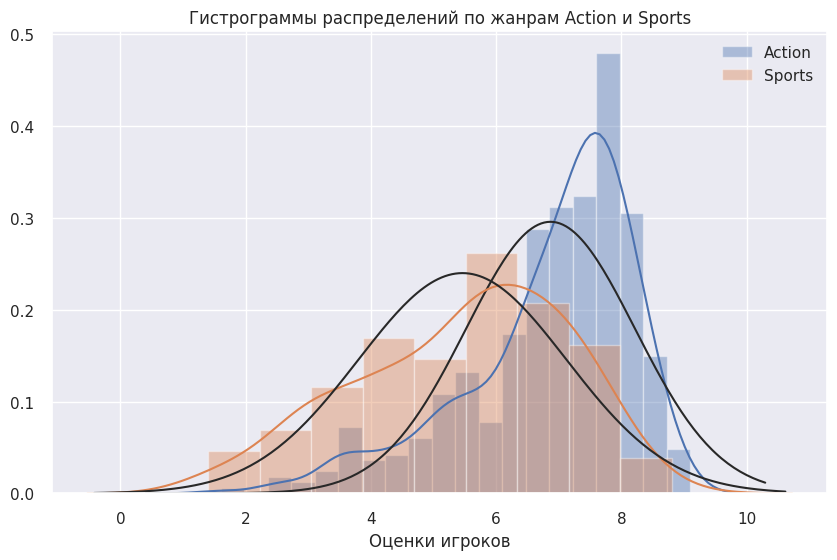

In [61]:
for column in ['user_score']:
    fig = plt.figure(figsize=(10,6))
    ax1 = sns.distplot(subdf_3, label='Action', fit=norm)
    ax2 = sns.distplot(subdf_4, label='Sports', fit=norm)
    ax3 = plt.legend()
    ax4 = plt.title('Гистрограммы распределений по жанрам Action и Sports')
    ax5 = plt.xlabel('Оценки игроков')
    plt.show() 

Чтобы проверить гипотезу о различии среднего двух выборок, применим двухсторонний тест, поскольку нам не требуется сравнивать динамику среднего значения.

Уровень статистической значимости установим в значении 0.05 (порог 5% считается общепринятиым).
Если p-value окажется меньше него - отвергнем нулевую гипотезу.

In [62]:
results = ttest(subdf_3, subdf_4, paired=False, tail='two-sided')

alpha = .05 

print('p-значение:', results['p-val'][0])

if results['p-val'][0] < alpha:
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу") 

p-значение: 1.838715928358654e-18
Отвергаем нулевую гипотезу


**Вывод по разделу "Проверка гипотез"**

Сформулированы и проверены гипотезы.
В первом случае не удалось отвергнуть нулевую гипотезу, во-втором - отвергаем нулевую гипотезу.

### Общий вывод

В ходе обработки набора данных были обработаны пропуски, сгенерированы новые признаки, скорректированы типы данных, удалены некорректные значения.

Анализ продаж по платформам показал различие рынков:
Платформы находящиеся на первых позициях по продажам на Американском и Европейском рынках, не входят в TOP-5 на Японском и наоборот.

Анализ жанров показал, что в Европе и Северной Америке лидурет жанр Action, в то время как в Японии лидирует Role-Playing т.к. там самые популярные серии игр Pokemon и Final Fantasy относятся к жанру Role-Playing.

Профиль пользователя Америки: взрослый/подросток, играющий в игры жанра Action/Sport на платформах X360/PS3/PS4  
Профиль пользователя Европы: взрослый/ребенок, играющий в игры жанра Action/Sport на платформах PS4/PS3  
Профиль пользователя Японии: подросток, играющий в игры жанра Role-Playing/Action на платформах 3DS/PS3

Пользовательские оценки и оценки критиков имеют равнозначные распределения для большинства жанров. Критики чаще ставят низкие оценки и оценивают жанры, которые пользователи считают непопулярными. Пользователи оценивают жанры Strategy, Sports и Simulation выше критиков, а критики ценят Puzzle больше пользователей.

Выявлены определяющие успешность игры закономерности.
Перед планированием рекламной кампании, первоначально следует определиться с рынком сбыта, т.к. в ходе исследования выявлены различия между Америкой/Европой и Японией.

Для Америки или Европы потенциально популярным продуктом является:
игра для детей/подростков жанра Action или Sport выпущенная под платформы PS4 или XOne

Для Японии потенциально популярным продуктом является:
игра в жанре Role-Playing или Action для портативных платформ 3DS или WiiU 